In [488]:
import pandas as pd
import numpy as np
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
import time
import umap
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, MiniBatchKMeans, DBSCAN, AgglomerativeClustering
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
from scipy.cluster.hierarchy import dendrogram, linkage

# Unsupervised Learning Capstone Project 

# Clustering 

# Challenge Objectives:

* Apply dimensionality reduction techniques to visualize the observations.
* Apply clustering techniques to group similar observations together.

In each of the tasks above, try alternative methods and select a best performing one. Discuss how dimensionality reduction and clustering algorithms enable you to gain insights regarding the data.

\- Thinkful project requirements

# **Notes On the Dataset:**

The data set consists of the expression levels of **77 proteins/protein modifications** that produced detectable signals in the nuclear fraction of cortex. There are **38 control mice** and **34 trisomic mice (Down syndrome)**, for a **total of 72 mice**. In the experiments, **15 measurements were registered of each protein per sample/mouse.** Therefore, for control mice, there are 38x15, or 570 measurements, and for trisomic mice, there are 34x15, or 510 measurements. **The dataset contains a total of 1,080 measurements per protein.** Each measurement can be considered as an independent sample/mouse.

**The eight classes of mice are described based on features such as genotype, behavior and treatment.** According to genotype, mice can be control or trisomic. According to behavior, some mice have been stimulated to learn (context-shock) and others have not (shock-context) and in order to assess the effect of the drug memantine in recovering the ability to learn in trisomic mice, some mice have been injected with the drug and others have not.

**Classes:**
- **c-CS-s:** control mice, stimulated to learn, injected with saline (9 mice)
- **c-CS-m:** control mice, stimulated to learn, injected with memantine (10 mice)
- **c-SC-s:** control mice, not stimulated to learn, injected with saline (9 mice)
- **c-SC-m:** control mice, not stimulated to learn, injected with memantine (10 mice)

- **t-CS-s**: trisomy mice, stimulated to learn, injected with saline (7 mice)
- **t-CS-m**: trisomy mice, stimulated to learn, injected with memantine (9 mice)
- **t-SC-s**: trisomy mice, not stimulated to learn, injected with saline (9 mice)
- **t-SC-m**: trisomy mice, not stimulated to learn, injected with memantine (9 mice)

\- [description via UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/datasets/Mice+Protein+Expression)

# Sources & Authors:

**Clara Higuera** - Department of Software Engineering and Artificial Intelligence, Faculty of Informatics and the Department of Biochemistry and Molecular Biology, Faculty of Chemistry, University Complutense, Madrid, Spain.
Email: clarahiguera@ucm.es

**Katheleen J. Gardiner** - creator and owner of the protein expression data, currently with the Linda Crnic Institute for Down Syndrome, Department of Pediatrics, Department of Biochemistry and Molecular Genetics, Human Medical Genetics and Genomics, and Neuroscience Programs, University of Colorado, School of Medicine, Aurora, Colorado, USA.
Email: katheleen.gardiner@ucdenver.edu

**Krzysztof J. Cios** - Department of Computer Science, Virginia Commonwealth University, Richmond, Virginia, USA, and IITiS Polish Academy of Sciences, Poland.
Email: kcios@vcu.edu

# Relevant Papers:

The posted data were analyzed by:

- **Higuera C, Gardiner KJ, Cios KJ.** (2015). *Self-Organizing Feature Maps Identify Proteins Critical to Learning in a Mouse Model of Down Syndrome.* PLoS ONE 10(6): e0129126. journal.pone.0129126 [[Link.]](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0129126)

The data are a subset of the data analyzed by: 

- **Ahmed MM, Dhanasekaran AR, Block A, Tong S, Costa ACS, Stasko M, et al.** (2015). *Protein Dynamics Associated with Failed and Rescued Learning in the Ts65Dn Mouse Model of Down Syndrome.* PLoS ONE 10(3): e0119491. [[Link.]](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0119491)

\- [information via UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/datasets/Mice+Protein+Expression)

# **Question:** 

***Are there observed similarities or shared characteristics between the protein expression of control mice and trisomy mice who have or have not been treated with memantine?***

**[*Memantine*](https://www.nature.com/articles/1301535)**: NMDA receptor antagonist, decreases abnormal activity in the brain.

# Impact: 

**Continued research and analysis of genetic expression and protein modification could impact not only geneticists and researchers, but also educators, neuroscientists, and the larger population. Examining connections between biology, cognition, and functioning can and will impact all forms of life.**

# Practical Uses:

Results from the application and analysis of clustering techniques could provide insights regarding the efficacy (and potential effectiveness) of medical intervention in protein modification and genetic expression. Analysis and further research could inform future research regarding "rescued learning," especially in Ts65Dn mice, as well as potentially effective pharmacotherapies.

# Model Selection:

Several clustering models and dimensionality reduction techniques were applied to the dataset and compared, including **k-means clustering**, **mini-batch k-means clustering**, **DBSCAN**, **heirarchical clustering**, **Principal Component Analysis**, **UMAP**, and **t-SNE**. Results were compared using **Adjusted Rand Index (A.R.I.) scores** and **silhouette coefficients**. 

# Open Dataset

In [489]:
cortex_df = pd.read_csv(r'/Users/thisiskatcooper/Desktop/D.S./Unsupervised Learning/Revisited/Data_Cortex_Nuclear.csv')

In [490]:
cortex_df.head(65)

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,...,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,...,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,...,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,...,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,...,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,Control,Memantine,C/S,c-CS-m
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,322_1,0.377846,0.555621,0.315109,2.220944,4.887097,0.194853,0.158325,3.391129,0.179554,...,0.127805,0.505059,NaN,NaN,NaN,1.817862,Control,Memantine,C/S,c-CS-m
61,322_2,0.390713,0.582699,0.333042,2.376732,5.211334,0.206716,0.170640,3.513544,0.189240,...,0.130997,0.497627,NaN,NaN,NaN,1.769405,Control,Memantine,C/S,c-CS-m
62,322_3,0.395358,0.576313,0.342568,2.356046,5.326220,0.207413,0.168601,3.511544,0.181580,...,0.122870,0.493719,NaN,NaN,NaN,1.723145,Control,Memantine,C/S,c-CS-m
63,322_4,0.384859,0.540699,0.322270,2.177809,4.799273,0.231863,0.174648,3.867236,0.183657,...,0.132692,0.491745,NaN,NaN,NaN,1.682970,Control,Memantine,C/S,c-CS-m


In [491]:
# determine dataframe shape

cortex_df.shape

(1080, 82)

**Note:** dataframe contains **82 features** and **1,080 observations** prior to cleaning.

In [492]:
# check for null values

cortex_df.isnull().sum()

MouseID      0
DYRK1A_N     3
ITSN1_N      3
BDNF_N       3
NR1_N        3
            ..
CaNA_N       0
Genotype     0
Treatment    0
Behavior     0
class        0
Length: 82, dtype: int64

In [493]:
# change capitalization for sake of consistency

cortex_df.rename(columns={'class':'Class'}, inplace=True)

In [494]:
cortex_df.isnull().sum()

MouseID      0
DYRK1A_N     3
ITSN1_N      3
BDNF_N       3
NR1_N        3
            ..
CaNA_N       0
Genotype     0
Treatment    0
Behavior     0
Class        0
Length: 82, dtype: int64

In [495]:
# print number of null values for each feature

for column in cortex_df:
    print('Number of null values in column {} is: {}'.format(column, cortex_df[column].isnull().sum()))

Number of null values in column MouseID is: 0
Number of null values in column DYRK1A_N is: 3
Number of null values in column ITSN1_N is: 3
Number of null values in column BDNF_N is: 3
Number of null values in column NR1_N is: 3
Number of null values in column NR2A_N is: 3
Number of null values in column pAKT_N is: 3
Number of null values in column pBRAF_N is: 3
Number of null values in column pCAMKII_N is: 3
Number of null values in column pCREB_N is: 3
Number of null values in column pELK_N is: 3
Number of null values in column pERK_N is: 3
Number of null values in column pJNK_N is: 3
Number of null values in column PKCA_N is: 3
Number of null values in column pMEK_N is: 3
Number of null values in column pNR1_N is: 3
Number of null values in column pNR2A_N is: 3
Number of null values in column pNR2B_N is: 3
Number of null values in column pPKCAB_N is: 3
Number of null values in column pRSK_N is: 3
Number of null values in column AKT_N is: 3
Number of null values in column BRAF_N is: 3

**Drop features** BAD_N, BCL2_N, pCFOS_N, H3AcK18_N, EGR1_N, H3MeK4_N due to number of missing values.

In [496]:
# drop columns

cortex_df = cortex_df.drop(columns=['BAD_N', 'BCL2_N', 'pCFOS_N', 'H3AcK18_N', 'EGR1_N', 'H3MeK4_N'])

In [497]:
# confirm that columns have been dropped

cortex_df.shape

(1080, 76)

In [498]:
# drop columns from DYRK1A_N through pP70S6_N
# 3 values are missing from each of these features
# dropping null values themselves lead to sparse data

cortex_df = cortex_df.drop(cortex_df.columns.to_series()['DYRK1A_N':'pP70S6_N'], axis=1)

In [499]:
# confirm that null values have been dropped

cortex_df.shape

(1080, 33)

In [500]:
# drop null values for remaining features
# confirm that null values have been dropped

cortex_df = cortex_df.dropna()
cortex_df.isnull().sum()

MouseID            0
NUMB_N             0
P70S6_N            0
pGSK3B_N           0
pPKCG_N            0
CDK5_N             0
S6_N               0
ADARB1_N           0
AcetylH3K9_N       0
RRP1_N             0
BAX_N              0
ARC_N              0
ERBB4_N            0
nNOS_N             0
Tau_N              0
GFAP_N             0
GluR3_N            0
GluR4_N            0
IL1B_N             0
P3525_N            0
pCASP9_N           0
PSD95_N            0
SNCA_N             0
Ubiquitin_N        0
pGSK3B_Tyr216_N    0
SHH_N              0
pS6_N              0
SYP_N              0
CaNA_N             0
Genotype           0
Treatment          0
Behavior           0
Class              0
dtype: int64

In [501]:
# additional confirmation - drop null values

cortex_df.shape

(1080, 33)

Cleaned dataframe contains **33 features** and **1,080 observations.**

In [502]:
# examine feature types

cortex_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1080 entries, 0 to 1079
Data columns (total 33 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   MouseID          1080 non-null   object 
 1   NUMB_N           1080 non-null   float64
 2   P70S6_N          1080 non-null   float64
 3   pGSK3B_N         1080 non-null   float64
 4   pPKCG_N          1080 non-null   float64
 5   CDK5_N           1080 non-null   float64
 6   S6_N             1080 non-null   float64
 7   ADARB1_N         1080 non-null   float64
 8   AcetylH3K9_N     1080 non-null   float64
 9   RRP1_N           1080 non-null   float64
 10  BAX_N            1080 non-null   float64
 11  ARC_N            1080 non-null   float64
 12  ERBB4_N          1080 non-null   float64
 13  nNOS_N           1080 non-null   float64
 14  Tau_N            1080 non-null   float64
 15  GFAP_N           1080 non-null   float64
 16  GluR3_N          1080 non-null   float64
 17  GluR4_N       

**Note:** There are **33 features** and **1,080 observations**. 

In [503]:
# print the number of unique values for the features Genotype, Treatment, Bahavior, and Class

columns = ['MouseID', 'Genotype', 'Treatment', 'Behavior', 'Class']

for column in columns:
    print("The number of unique values in '{}' is: {}".format(column, len(cortex_df[column].unique())))

The number of unique values in 'MouseID' is: 1080
The number of unique values in 'Genotype' is: 2
The number of unique values in 'Treatment' is: 2
The number of unique values in 'Behavior' is: 2
The number of unique values in 'Class' is: 8


In [504]:
# drop ending values for MouseID
# retain initial identifier as ID
# 72 mice total

cortex_df['ID'] = cortex_df['MouseID'].str.split('_').str[0]

In [505]:
# print the number of unique values in ID

print("The number of unique values in 'ID' is: {}".format(len(cortex_df['ID'].unique())))

The number of unique values in 'ID' is: 72


In [506]:
# drop MouseID

cortex_df = cortex_df.drop(columns=['MouseID'])

In [507]:
# print lists of unique values
# prepare to convert objects to integers

columns = ['ID', 'Genotype', 'Treatment', 'Behavior', 'Class']

for column in columns:
    print(cortex_df[column].unique())

['309' '311' '320' '321' '322' '3415' '3499' '3507' '3520' '3521' '294'
 '3412' '3413' '3419' '3420' '3500' '3503' '362' '364' '365' '3477' '3478'
 '3479' '3480' '3484' '3497' '50810A' '50810D' '50810F' '3422' '3423'
 '3424' '3481' '3488' '3489' '3490' '3516' 'J2292' '3414' '3416' '3417'
 '3429' '3504' '3505' '3522' '361' '363' '293' '3411' '3418' '3501' '3502'
 '3530' '3534' '3605' '3606' '18899' '3476' '3483' '3498' '50810B'
 '50810C' '50810E' '3421' '3425' '3426' '3491' '3513' '3517' '3525'
 'J1291' 'J3295']
['Control' 'Ts65Dn']
['Memantine' 'Saline']
['C/S' 'S/C']
['c-CS-m' 'c-SC-m' 'c-CS-s' 'c-SC-s' 't-CS-m' 't-SC-m' 't-CS-s' 't-SC-s']


In [508]:
# convert ID values featuring letters into numbers

cortex_df['ID'] = cortex_df['ID'].replace({'50810A':50810, '50810B':50811, '50810C':50812, '50810D':50813, 
                                           '50810E':50815, '50810F':50816, 'J2292':2292, 'J1291':1291, 'J3295':3295})

In [509]:
# convert values for MouseID into integers

cortex_df['ID'] = cortex_df['ID'].astype(str).astype(int)

In [510]:
# convert values for 'Genotype' into integers
# Control = 0, Ts65Dn = 1

cortex_df['Genotype'] = cortex_df['Genotype'].replace({'Control' : 0, 'Ts65Dn' : 1})

# convert values for 'Treatment' into integers
# Memantine = 0, Saline = 1

cortex_df['Treatment'] = cortex_df['Treatment'].replace({'Memantine': 0, 'Saline': 1})

# convert 'Behavior' into integers
# C/S = 0, S/C = 1

cortex_df['Behavior'] = cortex_df['Behavior'].replace({'C/S': 0, 'S/C': 1})

# convert 'class' into integers from 1 - 8

cortex_df['Class'] = cortex_df['Class'].replace({'c-CS-m': 1, 'c-SC-m': 2, 'c-CS-s': 3, 'c-SC-s': 4, 't-CS-m': 5, 't-SC-m': 6, 't-CS-s': 7, 't-SC-s': 8})

In [511]:
# confirm that dataframe includes only floats and integer dtypes

cortex_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1080 entries, 0 to 1079
Data columns (total 33 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   NUMB_N           1080 non-null   float64
 1   P70S6_N          1080 non-null   float64
 2   pGSK3B_N         1080 non-null   float64
 3   pPKCG_N          1080 non-null   float64
 4   CDK5_N           1080 non-null   float64
 5   S6_N             1080 non-null   float64
 6   ADARB1_N         1080 non-null   float64
 7   AcetylH3K9_N     1080 non-null   float64
 8   RRP1_N           1080 non-null   float64
 9   BAX_N            1080 non-null   float64
 10  ARC_N            1080 non-null   float64
 11  ERBB4_N          1080 non-null   float64
 12  nNOS_N           1080 non-null   float64
 13  Tau_N            1080 non-null   float64
 14  GFAP_N           1080 non-null   float64
 15  GluR3_N          1080 non-null   float64
 16  GluR4_N          1080 non-null   float64
 17  IL1B_N        

**Target:** Class.

# K-means Clustering

In [512]:
# define X and y

y = cortex_df['Class']
X = cortex_df.drop(columns=['Class'])

In [513]:
# standardize X using StandardScaler

scaler = StandardScaler() 
X_std = scaler.fit_transform(X)

In [514]:
# define k-means

kmeans_cluster = KMeans(n_clusters=8, random_state=456)

# time and fit the model

%timeit kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.fit_predict(X_std)

107 ms ± 571 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


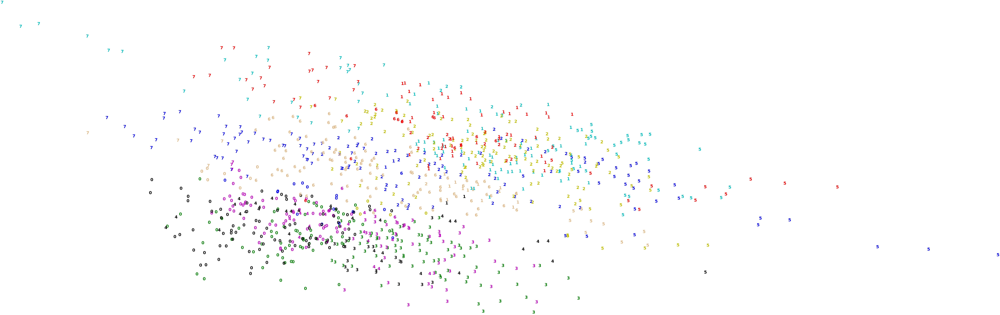

In [515]:
# perform pca on the first two components

pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours='r','b','g','c','m','y','k','r','burlywood','chartreuse'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred[i]),
            color=colours[y[i]],
            fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [516]:
# calculate adjusted rand score

print('Adjusted Rand Index (ARI) score: {}'.format(metrics.adjusted_rand_score(y, y_pred)))

# calculate silhouette coefficient

print('\nSilhouette coefficient: {}'.format(metrics.silhouette_score(X_std, y_pred, metric='euclidean')))

Adjusted Rand Index (ARI) score: 0.30567229224649733

Silhouette coefficient: 0.12781911224428374


**Comparison of Results ['Class']:**

n_clusters=4: A.R.I. 0.23039, silhouette coefficient 0.16095.

n_clusters=5: A.R.I. 0.23052, silhouette coefficient 0.14876.

n_clusters=6: A.R.I. 0.18752, silhouette coefficient 0.11627.

n_clusters=7: A.R.I. 0.19988, silhouette coefficient 0.11998.

**n_clusters=8: A.R.I. 0.30567, silhouette coefficient 0.12781.**

n_clusters=9: A.R.I. 0.29165, silhouette coefficient 0.13177.

# Mini-Batch K-means Clustering

In [517]:
y = cortex_df['Class']
X = cortex_df.drop(columns=['Class'])

In [518]:
# standardize X using StandardScaler

X_std = scaler.fit_transform(X)

In [519]:
# define mini-batch k-means

minikmeans_cluster = MiniBatchKMeans(
    init='random',
    n_clusters=9,
    batch_size=75)

# time the model

%timeit minikmeans_cluster.fit(X_std)


# fit the model

y_pred_mini = minikmeans_cluster.predict(X_std)

16.8 ms ± 562 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


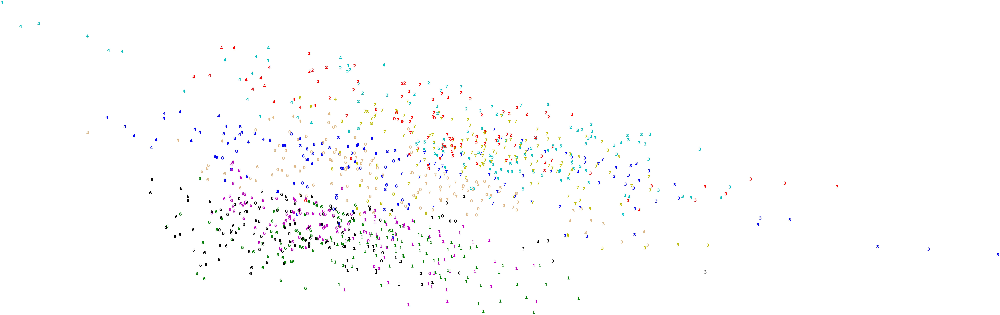

In [520]:
plt.figure(figsize=(10,5))
colours = 'r','b','g','c','m','y','k','r','burlywood','chartreuse'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred_mini[i]),
            color=colours[y[i]],
            fontdict={'weight': 'bold', 'size': 50}
            )
    
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [521]:
# calculate adjusted rand score

print('Adjusted Rand Index (ARI) score: {}'.format(metrics.adjusted_rand_score(y, y_pred_mini)))

# calculate silhouette score

print('\nSilhouette coefficient: {}'.format(metrics.silhouette_score(X_std, y_pred_mini, metric='euclidean')))

Adjusted Rand Index (ARI) score: 0.27848577154726695

Silhouette coefficient: 0.12270915249110156


**Comparison of Results ['Class']:**

n_clusters=2, batch_size=100: A.R.I. 0.04808, silhouette coefficient 0.13569.

n_clusters=3, batch_size=100: A.R.I. 0.21769, silhouette coefficient 0.15328.

n_clusters=4, batch_size=100: A.R.I. 0.21634, silhouette coefficient 0.14084.

n_clusters=5, batch_size=100: A.R.I. 0.17331, silhouette coefficient 0.12426.

n_clusters=6, batch_size=100: A.R.I. 0.20404, silhouette coefficient 0.13050.

n_clusters=7, batch_size=50: A.R.I. 0.21763, silhouette coefficient 0.11786.

n_clusters=7, batch_size=75: A.R.I. 0.24912, silhouette coefficient 0.12036.

n_clusters=7, batch_size=100: A.R.I. 0.22195, silhouette coefficient 0.10986.

n_clusters=7, batch_size=200: A.R.I. 0.22510, silhouette coefficient 0.11547.

n_clusters=7, batch_size=300: A.R.I. 0.20844, silhouette coefficient 0.11004.

n_clusters=8, batch_size=50: A.R.I. 0.19566, silhouette coefficient 0.09787.

n_clusters=8, batch_size=75: A.R.I. 0.18664, silhouette coefficient 0.11613.

n_clusters=8, batch_size=100: A.R.I. 0.21089, silhouette coefficient 0.10061.

n_clusters=9, batch_size=50: A.R.I. 0.20446, silhouette coefficient 0.11943.

**n_clusters=9, batch_size=75: A.R.I. 0.27849, silhouette coefficient 0.12271.**

n_clusters=9, batch_size=100: A.R.I. 0.25752, silhouette coefficient 0.12619.

**Note:** A.R.I. and silhouette scores for mini-batch k-means are lower than that of the previous (k-means) model.

# Hierarchical Clustering

In [522]:
y = cortex_df['Class']
X = cortex_df.drop(columns=['Class'])

In [523]:
# standardize using StandardScaler

X_std = scaler.fit_transform(X)

In [524]:
# define agglomerative clustering

agg_cluster = AgglomerativeClustering(linkage='average',
                                     affinity='cosine',
                                     n_clusters=8)

# fit the model

y_pred_agg = agg_cluster.fit_predict(X_std)

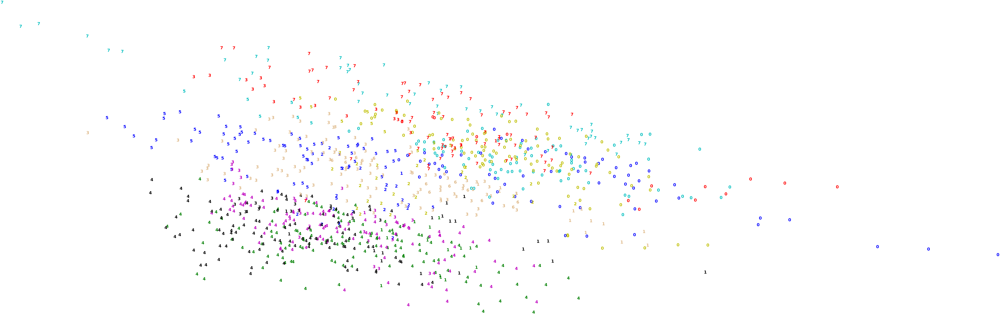

In [525]:
# apply pca and use first 2 principal components

pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'r','b','g','c','m','y','k','r','burlywood','chartreuse'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred_agg[i]),
            color=colours[y[i]],
            fontdict={'weight': 'bold', 'size': 50}
        )
    
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [526]:
# calculate adjusted rand index

print('Adjusted Rand Index (ARI) score: {}'
      .format(metrics.adjusted_rand_score(y, y_pred_agg)))

# calculate silhouette coefficient

print('\nSilhoutte coefficient: {}'.format(metrics.silhouette_score(X_std, y_pred_agg, metric='cosine')))

Adjusted Rand Index (ARI) score: 0.3489737248958358

Silhoutte coefficient: 0.2050203264992409


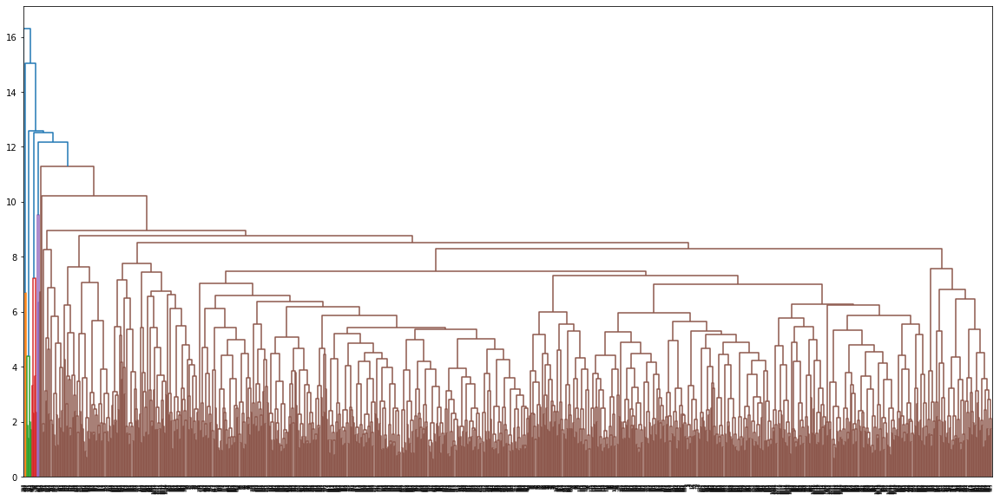

In [527]:
# plot dendrogram

plt.figure(figsize=(20,10))
dendrogram(linkage(X_std, method='average'))
plt.show()

Dendogram is very imbalanced.

In [528]:
y = cortex_df['Class']
X = cortex_df.drop(columns=['Class'])

In [529]:
X_std = scaler.fit_transform(X)

In [530]:
# compare plot and dendrogram of average and complete linkage
# define agglomerative clustering

agg_cluster = AgglomerativeClustering(linkage='ward',
                                     affinity='euclidean',
                                     n_clusters=8)

# fit the model

y_pred_agg = agg_cluster.fit_predict(X_std)

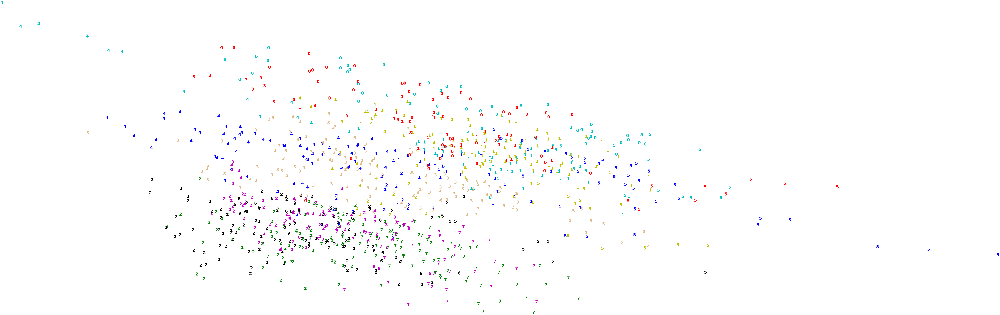

In [531]:
# apply pca and use first 2 principal components

pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'r','b','g','c','m','y','k','r','burlywood','chartreuse'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred_agg[i]),
            color=colours[y[i]],
            fontdict={'weight': 'bold', 'size': 50}
        )
    
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [532]:
# calculate adjusted rand index

print('Adjusted Rand Index (ARI) score: {}'
      .format(metrics.adjusted_rand_score(y, y_pred_agg)))

# calculate silhouette coefficient

print('\nSilhoutte coefficient: {}'.format(metrics.silhouette_score(X_std, y_pred_agg, metric='euclidean')))

Adjusted Rand Index (ARI) score: 0.3389738386355969

Silhoutte coefficient: 0.11412390569279499


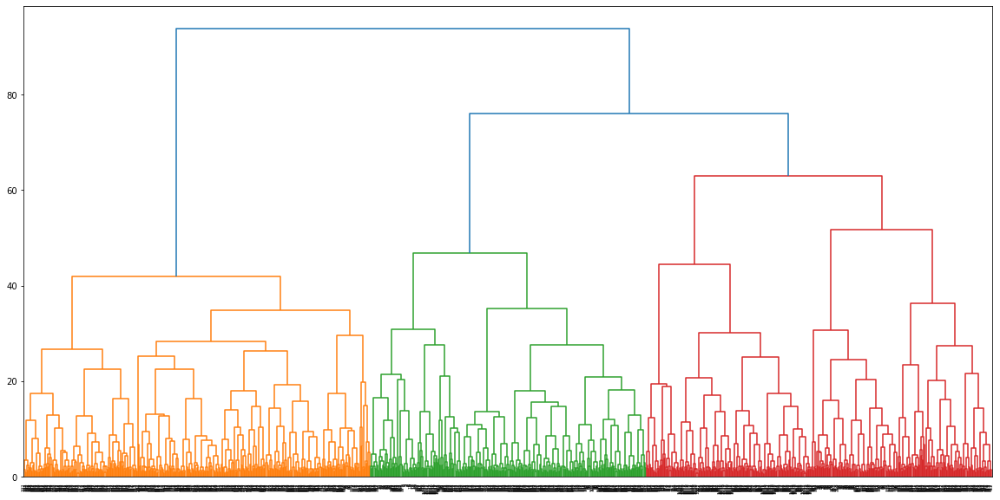

In [533]:
# plot dendrogram

plt.figure(figsize=(20,10))
dendrogram(linkage(X_std, method='ward'))
plt.show()

**Comparison of Results ['Class']:**

n_clusters=2, n_components=2, affinity=euclidean: A.R.I. 0.00225, silhouette coefficient 0.17770.

n_clusters=2, n_components=2, affinity=cosine: A.R.I. 0.03629, silhouette coefficient 0.12092.

n_clusters=3, n_components=2, affinity=euclidean: A.R.I. 0.00273, silhouette coefficient 0.15679.

n_clusters=3, n_components=2, affinity=cosine: A.R.I. 0.19577, silhouette coefficient 0.16938.

n_clusters=4, n_components=2, affinity=euclidean: A.R.I. 0.00269, silhouette coefficient 0.14359.

n_clusters=4, n_components=2, affinity=cosine: A.R.I. 0.24418, silhouette coefficient 0.13835.

n_clusters=5, n_components=2, affinity=euclidean: A.R.I. 0.00269, silhouette coefficient 0.13317.

n_clusters=5, n_components=2, affinity=cosine: A.R.I. 0.26531, silhouette coefficient 0.13392.

n_clusters=5, n_components=2, affinity=manhattan: A.R.I. 0.05589, silhouette coefficient 0.09137.

n_clusters=6, n_components=2, affinity=euclidean, linkage=complete: A.R.I. 0.00270, silhouette coefficient 0.11589.

n_clusters=6, n_components=2, affinity=euclidean, linkage=average: A.R.I. 0.00027, silhouette coefficient 0.28594.

n_clusters=6, n_components=2, affinity=euclidean, linkage=ward: A.R.I. 0.29644, silhouette coefficient 0.14113.

n_clusters=6, n_components=2, affinity=cosine, linkage=complete: A.R.I. 0.29987, silhouette coefficient 0.16812.

n_clusters=6, n_components=2, affinity= cosine, linkage=average: A.R.I. 0.32352, silhouette coefficient 0.18509.

n_clusters=6, n_components=2, affinity=manhattan, linkage=complete: A.R.I. 0.16769, silhouette coefficient 0.06376.

n_clusters=6, n_components=2, affinity=manhattan, linkage=average: A.R.I. 0.06902, silhouette coefficient 0.07617.

n_clusters=7, n_components=2, affinity=euclidean, linkage=complete: A.R.I. 0.00539, silhouette coefficient 0.07917.

n_clusters=7, n_components=2, affinity=euclidean, linkage=average: A.R.I. 0.00062, silhouette coefficient 0.26115.

n_clusters=7, n_components=2, affinity=euclidean, linkage=ward: A.R.I. 0.33889, silhouette coefficient 0.13589.

n_clusters=7, n_components=2, affinity=cosine, linkage=complete: A.R.I. 0.26110, silhouette coefficient 0.15294.

n_clusters=7, n_components=2, affinity=cosine, linkage=average: A.R.I. 0.31568, silhouette coefficient 0.17588.

n_clusters=7, n_components=2, affinity=manhattan, linkage=complete: A.R.I. 0.23123, silhouette coefficient 0.08156.

n_clusters=7, n_components=2, affinity=manhattan, linkage=average: A.R.I. 0.00365, silhouette coefficient 0.09385.

**n_clusters=8, n_components=2, affinty=cosine, linkage=average: A.R.I. 0.34897, silhouette coefficient 0.20502.**

n_clusters=8, n_components=2, affinty=cosine, linkage=complete: A.R.I. 0.26685, silhouette coefficient 0.15413.

n_clusters=8, n_components=2, affinty=euclidean, linkage=average: A.R.I. 0.00056, silhouette coefficient 0.20232.

n_clusters=8, n_components=2, affinty=euclidean, linkage=complete: A.R.I. 0.00827, silhouette coefficient 0.08720.

**n_clusters=8, n_components=2, affinty=euclidean, linkage=ward: A.R.I. 0.33897, silhouette coefficient 0.11412.** (Clear dendrogram)

n_clusters=8, n_components=2, affinty=manhattan, linkage=average: A.R.I. 0.00363, silhouette coefficient 0.07647. (Clear dendrogram)

n_clusters=8, n_components=2, affinty=manhattan, linkage=complete: A.R.I. 0.23081, silhouette coefficient 0.08503.

**Note:** A.R.I. score has increased in comparison to k-means and mini-batch k-means models, though there appears to be a trade-off with the silhouette score. Dendrogram of second model is more clear than that of the first.

# DBSCAN

In [534]:
y = cortex_df['Class']
X = cortex_df.drop(columns=['Class'])

In [535]:
# standardize using StandardScaler

X_std = scaler.fit_transform(X)

In [536]:
# define DBSCAN

dbscan_cluster = DBSCAN(eps=3, min_samples=2)

# fit the model

y_pred_dbscan = dbscan_cluster.fit_predict(X_std)

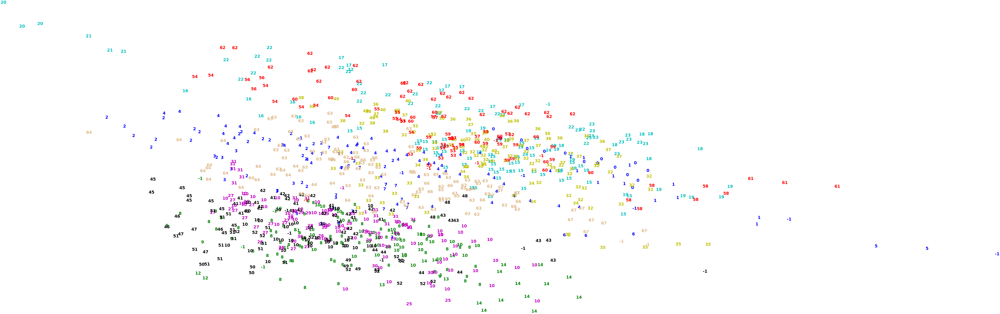

In [537]:
pca = PCA(n_components=3).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = ['r','b','g','c','m','y','k','r','burlywood','chartreuse']
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred_dbscan[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [538]:
# calculate adjusted rand index

print('Adjusted Rand Index (ARI) score: {}'.format(metrics.adjusted_rand_score(y, y_pred_dbscan)))

# calculate silhouette coefficient

print('\nSilhoutte coefficient: {}'.format(metrics.silhouette_score(X_std, y_pred_dbscan, metric='euclidean')))

Adjusted Rand Index (ARI) score: 0.32050507580807547

Silhoutte coefficient: 0.18478636415178212


**Comparison of Results ['Class']:**

eps=2, min_samples=7: A.R.I. 0.01137, silhouette coefficient -0.17045.

**eps=3, min_samples=2: A.R.I. 0.32050, silhouette coefficient 0.18479.**

eps=3, min_samples=3: A.R.I. 0.31975, silhouette coefficient 0.16986.

eps=3, min_samples=4: A.R.I. 0.31475, silhouette coefficient 0.14449.

eps=3, min_samples=5: A.R.I. 0.31174, silhouette coefficient 0.13848.

eps=3, min_samples=6: A.R.I. 0.30127, silhouette coefficient 0.12827.

eps=3, min_samples=7: A.R.I. 0.28262, silhouette coefficient 0.10461.

eps=3, min_samples=8: A.R.I. 0.25706, silhouette coefficient 0.07908.

eps=4, min_samples=7: A.R.I. 0.00479, silhouette coefficient 0.00601.

eps=7, min_samples=7: A.R.I. -8.14076e-05, silhouette coefficient 0.43047.

**Note:** A.R.I. score is slightly lower than that of HCA models, however the silhouette coefficient has increased.

# PCA: n_components = 2

In [539]:
y = cortex_df['Class']
X = cortex_df.drop(columns=['Class'])

In [540]:
# standardize using StandardScaler

X = scaler.fit_transform(X_std)

In [541]:
# define pca

pca = PCA(n_components=2)

# fit the model

pca_components = pca.fit_transform(X_std)

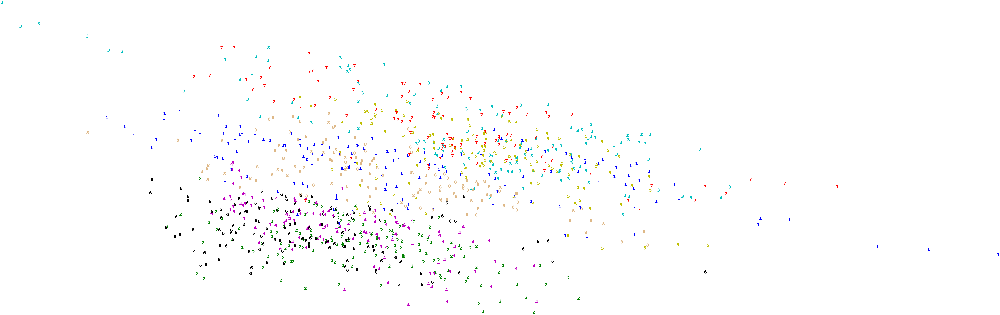

In [542]:
plt.figure(figsize=(10,5))
colours = ['r','b','g','c','m','y','k','r','burlywood','chartreuse']
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [543]:
# print explained variance ratio (cumulative sum)

print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_.cumsum()))

Explained variation per principal component: [0.23287043 0.40384507]


In [544]:
# visualize explained variance ratio per principal component

import plotly.express as px

n_components = 2
pca = PCA(n_components=n_components)
pca_components = pca.fit_transform(X_std)

total_var = pca.explained_variance_ratio_.sum() * 100

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
labels['color'] = 'Class'

fig = px.scatter_matrix(
    pca_components,
    dimensions=range(n_components),
    labels=labels,
    title=f'Total Explained Variance: {total_var:.2f}%',
)
fig.update_traces(diagonal_visible=False)
fig.show()

# PCA: n_components = 3

In [545]:
y = cortex_df['Class']
X = cortex_df.drop(columns=['Class'])

In [546]:
# standardize using StandardScaler

X_std = scaler.fit_transform(X)

In [547]:
# define pca

pca = PCA(n_components=3)

# fit the model

pca_components = pca.fit_transform(X_std)

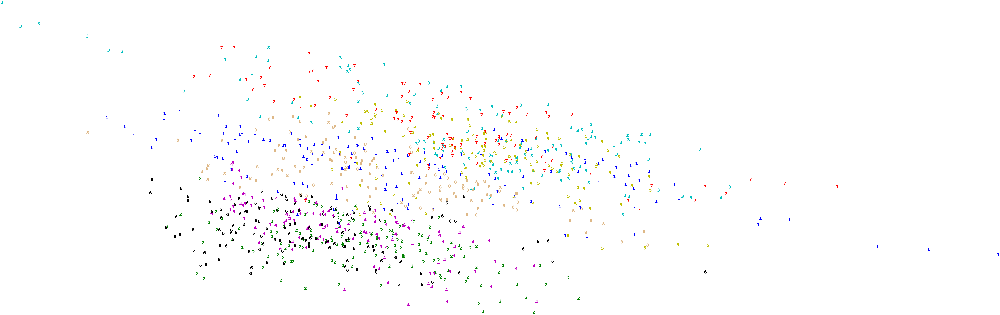

In [548]:
plt.figure(figsize=(10,5))
colours = ['r','b','g','c','m','y','k','r','burlywood','chartreuse']
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

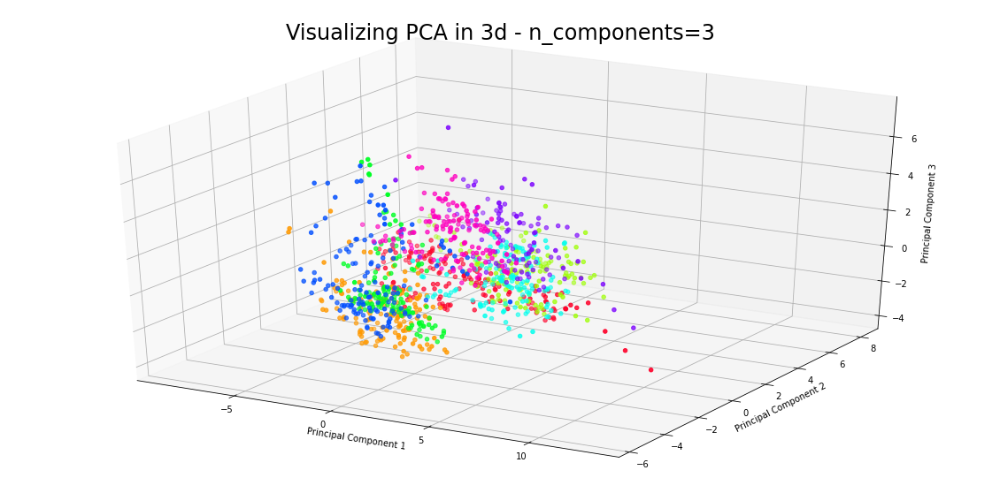

In [549]:
# plot pca in 3d

ax = plt.figure(figsize=(20,10)).gca(projection='3d')
ax.scatter(
    xs=pca_components[:, 0],
    ys=pca_components[:, 1],
    zs=pca_components[:, 2],
    c=y,
    cmap='gist_rainbow'
)

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.title('Visualizing PCA in 3d - n_components=3', fontsize=24)
plt.show()

In [550]:
# print explained variance ratio (cumulative sum)

print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_.cumsum()))

Explained variation per principal component: [0.23287043 0.40384507 0.50415477]


In [551]:
# visualize explained variance ratio per principal component

n_components = 3
pca = PCA(n_components=n_components)
pca_components = pca.fit_transform(X_std)

total_var = pca.explained_variance_ratio_.sum() * 100

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
labels['color'] = 'Class'

fig = px.scatter_matrix(
    pca_components,
    dimensions=range(n_components),
    labels=labels,
    title=f'Total Explained Variance: {total_var:.2f}%',
)
fig.update_traces(diagonal_visible=False)
fig.show()

# PCA: n_components = 4

In [552]:
y = cortex_df['Class']
X = cortex_df.drop(columns=['Class'])

In [553]:
# standardize using StandardScaler

X_std = scaler.fit_transform(X)

In [554]:
# define pca

pca = PCA(n_components=4)

# fit the model

pca_components = pca.fit_transform(X_std)

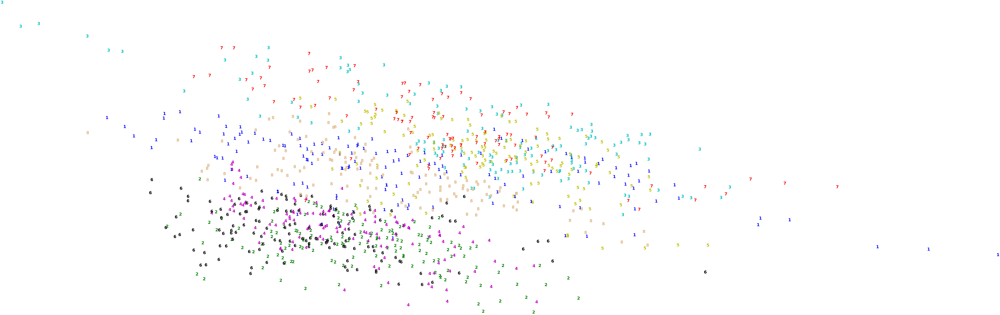

In [555]:
plt.figure(figsize=(10,5))
colours = ['r','b','g','c','m','y','k','r','burlywood','chartreuse']
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [556]:
# print explained variance ratio (cumulative sum)

print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_.cumsum()))

Explained variation per principal component: [0.23287043 0.40384507 0.50415477 0.57092282]


In [557]:
# visualize explained variance ratio per principal component

n_components = 4
pca = PCA(n_components=n_components)
pca_components = pca.fit_transform(X_std)

total_var = pca.explained_variance_ratio_.sum() * 100

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
labels['color'] = 'Class'

fig = px.scatter_matrix(
    pca_components,
    dimensions=range(n_components),
    labels=labels,
    title=f'Total Explained Variance: {total_var:.2f}%',
)
fig.update_traces(diagonal_visible=False)
fig.show()

# PCA: n_components = 5

In [558]:
y = cortex_df['Class']
X = cortex_df.drop(columns=['Class'])

In [559]:
# standardize using StandardScaler

X_std = scaler.fit_transform(X)

In [560]:
# define pca

pca = PCA(n_components=5)

# fit the model

pca_components = pca.fit_transform(X_std)

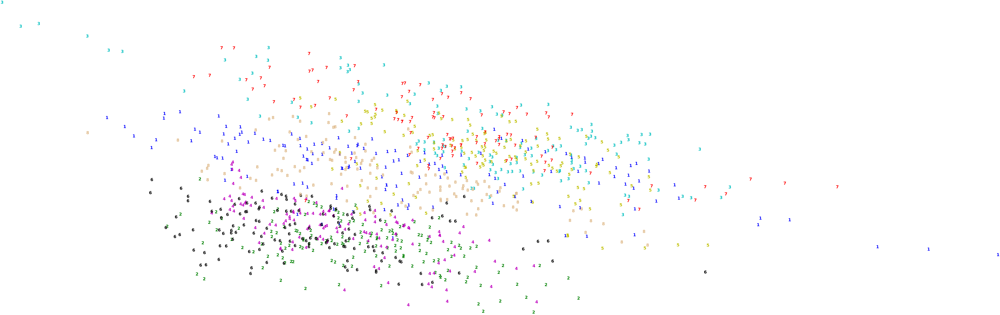

In [561]:
plt.figure(figsize=(10,5))
colours = ['r','b','g','c','m','y','k','r','burlywood','chartreuse']
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )
    
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [562]:
# print explained variance ratio (cumulative sum)

print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_.cumsum()))

Explained variation per principal component: [0.23287043 0.40384507 0.50415477 0.57092283 0.63103342]


In [563]:
# visualize explained variance ratio per principal component

n_components = 5
pca = PCA(n_components=n_components)
pca_components = pca.fit_transform(X_std)

total_var = pca.explained_variance_ratio_.sum() * 100

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
labels['color'] = 'Class'

fig = px.scatter_matrix(
    pca_components,
    dimensions=range(n_components),
    labels=labels,
    title=f'Total Explained Variance: {total_var:.2f}%',
)
fig.update_traces(diagonal_visible=False)
fig.show()

# PCA: n_components = 6

In [564]:
y = cortex_df['Class']
X = cortex_df.drop(columns=['Class'])

In [565]:
# standardize using StandardScaler

X_std = scaler.fit_transform(X)

In [566]:
# define pca

pca = PCA(n_components=6)

# fit the model

pca_components = pca.fit_transform(X_std)

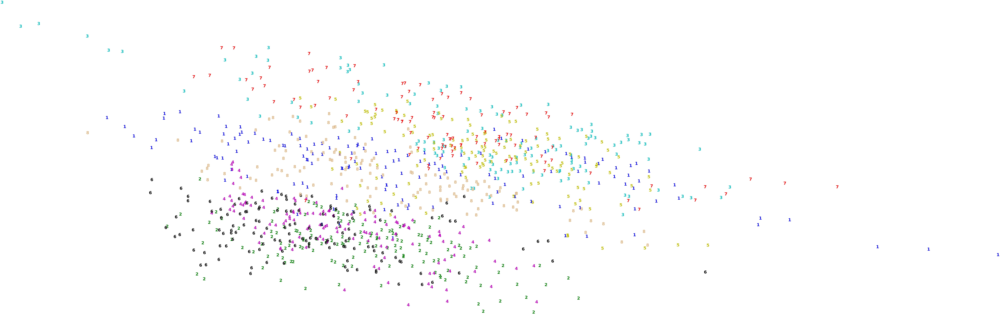

In [567]:
plt.figure(figsize=(10,5))
colours = ['r','b','g','c','m','y','k','r','burlywood','chartreuse']
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [568]:
# print explained variance ratio (cumulative sum)

print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))

Explained variation per principal component: [0.23287043 0.17097464 0.1003097  0.06676806 0.06011052 0.04731535]


In [569]:
# visualize explained variance ratio per principal component

pca = PCA(n_components=6)
pca_components = pca.fit_transform(X_std)

total_var = pca.explained_variance_ratio_.sum() * 100

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
labels['color'] = 'Class'

fig = px.scatter_matrix(
    pca_components,
    dimensions=range(n_components),
    labels=labels,
    title=f'Total Explained Variance: {total_var:.2f}%',
)
fig.update_traces(diagonal_visible=False)
fig.show()

# PCA: n_components = 7

In [570]:
y = cortex_df['Class']
X = cortex_df.drop(columns=['Class'])

In [571]:
# standardize using StandardScaler

X_std = scaler.fit_transform(X)

In [572]:
# define pca

pca = PCA(n_components=7)

# fit the model

pca_components = pca.fit_transform(X_std)

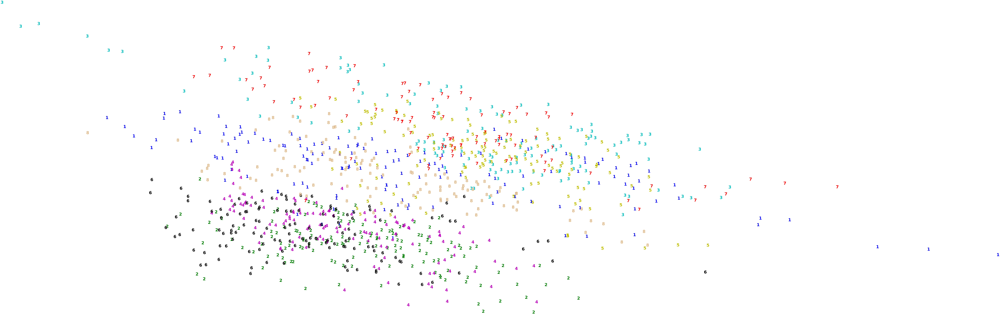

In [573]:
plt.figure(figsize=(10,5))
colours = ['r','b','g','c','m','y','k','r','burlywood','chartreuse']
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [574]:
# print explained variance ratio (cumulative sum)

print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))

Explained variation per principal component: [0.23287043 0.17097464 0.1003097  0.06676806 0.06011058 0.04731478
 0.0401539 ]


In [575]:
# visualize explained variance ratio per principal component

pca = PCA(n_components=7)
pca_components = pca.fit_transform(X_std)

total_var = pca.explained_variance_ratio_.sum() * 100

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
labels['color'] = 'Class'

fig = px.scatter_matrix(
    pca_components,
    dimensions=range(n_components),
    labels=labels,
    title=f'Total Explained Variance: {total_var:.2f}%',
)
fig.update_traces(diagonal_visible=False)
fig.show()

# PCA: n_components = 8

In [576]:
y = cortex_df['Class']
X = cortex_df.drop(columns=['Class'])

In [577]:
# standardize using StandardScaler

X_std = scaler.fit_transform(X)

In [578]:
# define pca

pca = PCA(n_components=8)

# fit the model

pca_components = pca.fit_transform(X_std)

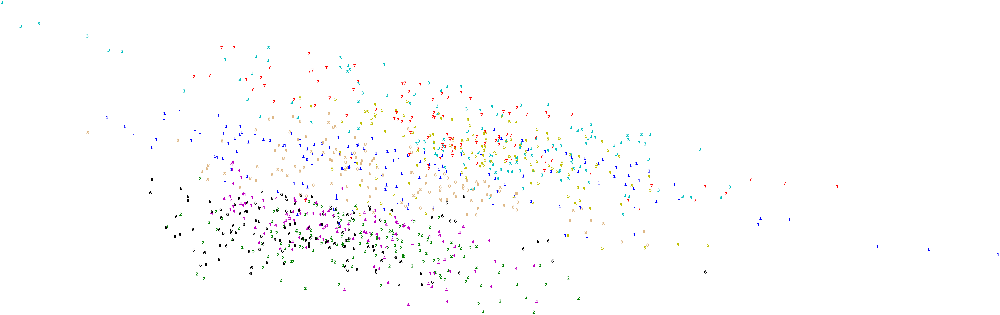

In [579]:
plt.figure(figsize=(10,5))
colours = ['r','b','g','c','m','y','k','r','burlywood','chartreuse']
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [580]:
# print explained variance ratio (cumulative sum)

print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))

Explained variation per principal component: [0.23287043 0.17097464 0.1003097  0.06676807 0.06011061 0.04731539
 0.04015587 0.0369498 ]


In [581]:
# visualize explained variance ratio per principal component

pca = PCA(n_components=8)
pca_components = pca.fit_transform(X_std)

total_var = pca.explained_variance_ratio_.sum() * 100

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
labels['color'] = 'Class'

fig = px.scatter_matrix(
    pca_components,
    dimensions=range(n_components),
    labels=labels,
    title=f'Total Explained Variance: {total_var:.2f}%',
)
fig.update_traces(diagonal_visible=False)
fig.show()

# t-SNE

In [582]:
y = cortex_df['Class']
X = cortex_df.drop(columns=['Class'])

In [583]:
# standardize using StandardScaler

X_std = scaler.fit_transform(X)

In [584]:
time_start = time.time()
tsne = TSNE(n_components=3, verbose=2, perplexity=110, n_iter=300)
tsne_results = tsne.fit_transform(X_std)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 331 nearest neighbors...
[t-SNE] Indexed 1080 samples in 0.001s...
[t-SNE] Computed neighbors for 1080 samples in 0.110s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1080
[t-SNE] Computed conditional probabilities for sample 1080 / 1080
[t-SNE] Mean sigma: 2.748196
[t-SNE] Computed conditional probabilities in 0.113s
[t-SNE] Iteration 50: error = 55.9929314, gradient norm = 0.0435417 (50 iterations in 0.497s)
[t-SNE] Iteration 100: error = 55.9914017, gradient norm = 0.0383552 (50 iterations in 0.384s)
[t-SNE] Iteration 150: error = 55.9916992, gradient norm = 0.0386140 (50 iterations in 0.403s)
[t-SNE] Iteration 200: error = 55.9899788, gradient norm = 0.0343690 (50 iterations in 0.381s)
[t-SNE] Iteration 250: error = 55.9929733, gradient norm = 0.0416465 (50 iterations in 0.373s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.992973
[t-SNE] Iteration 300: error = 0.5124982, gradient norm = 0.0005270 (50 iterations in 0.267s

In [585]:
plt.figure(figsize=(10,5))
colours = ['r','b','g','c','m','y','k','r','burlywood','chartreuse']
for i in range(tsne_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

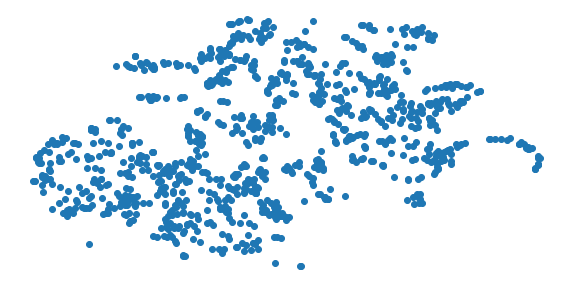

In [586]:
plt.figure(figsize=(10,5))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

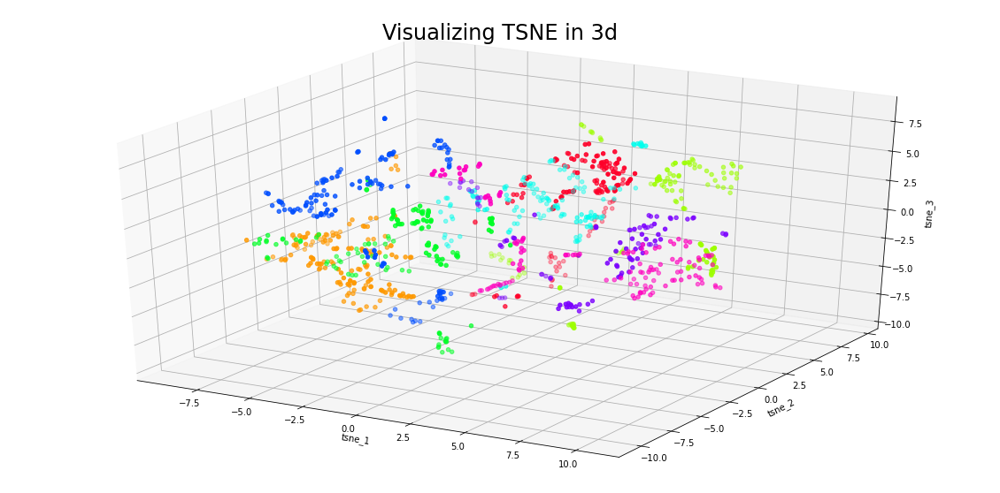

In [587]:
# plot t-sne in 3d

fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(tsne_results[:, 0], tsne_results[:, 1],tsne_results[:, 2], c=y, cmap='gist_rainbow')
ax.set_xlabel('tsne_1')
ax.set_ylabel('tsne_2')
ax.set_zlabel('tsne_3')
plt.title('Visualizing TSNE in 3d', fontsize=24);
plt.show()

**Note:** clusters are not the most distinct.

# UMAP

In [588]:
y = cortex_df['Class']
X = cortex_df.drop(columns=['Class'])

In [589]:
# standardize using StandardScaler

X_std = scaler.fit_transform(X)

In [590]:
# plot t-sne for 'Class'

time_start = time.time()

umap_fit = umap.UMAP(n_neighbors=50,
                      min_dist=.7,
                      metric='correlation')

umap_results = umap_fit.fit_transform(X_std)

print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

UMAP done! Time elapsed: 2.4948220252990723 seconds


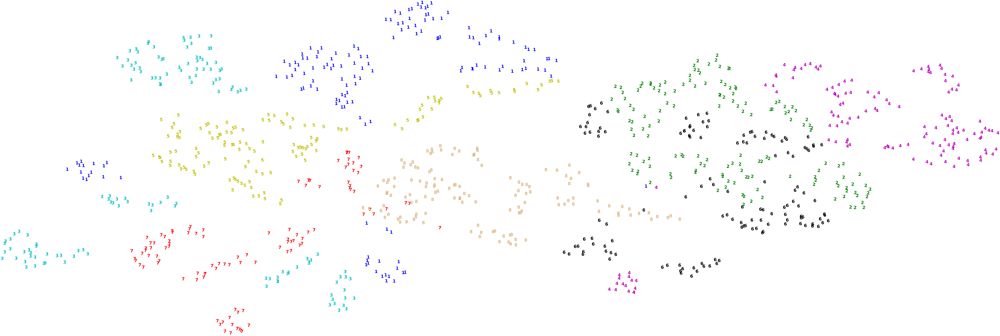

In [591]:
plt.figure(figsize=(10,5))
colours = ['r','b','g','c','m','y','k','r','burlywood','chartreuse']
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

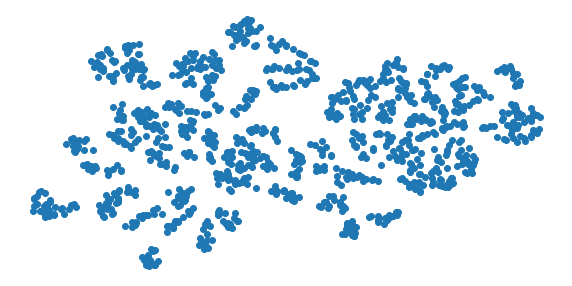

In [592]:
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [599]:
import umap.plot

In [600]:
mapper = umap_fit.fit(X_std)
mapper_transform2 = umap_fit.fit_transform(X_std)

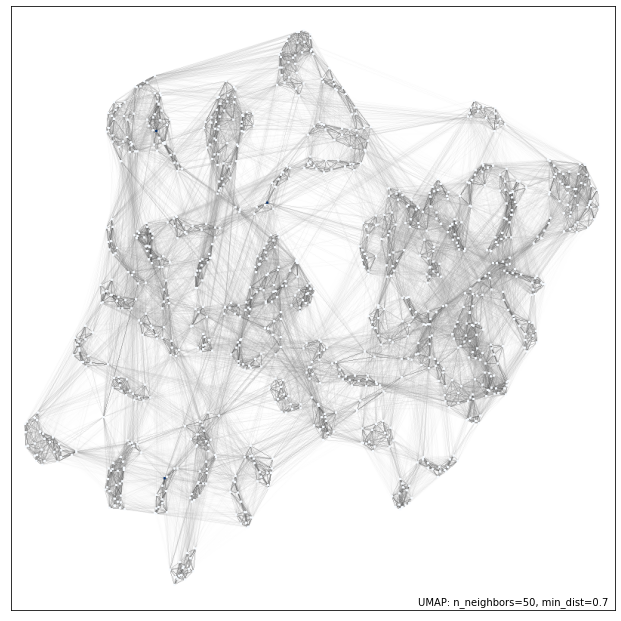

In [601]:
umap.plot.connectivity(mapper, show_points=True)

**Note:** UMAP and t-SNE show some differentiation/separation of clusters. UMAP appears to be the top performer of the two with the most distinct clusters.

# Conclusions:

Adjusted Rand Scores and silhouette coefficients indicate that the top performing models for our dataset are variations of **HCA** and **DBSCAN** models. Dimensionality reduction shows promise using **UMAP**. While clustering is apparent in some instances, additional work could be done to assess and optimize model performance.


# Potential Shortcomings:

Our dataset could be more robust for further exploration and examination. Missing values led to the exclusion of several protein measurements and the scope of the study is somewhat limited. Alternate clustering models could also be created and compared.

# Next Steps:

To continue exploration of the results and observations of this study:
- increase the scope of the dataset (number of participants, continued measurements and samples).
- use information and models to predict potential efficacy of laboratory treatment and/or potential effectiveness and applications in real-world settings.
- explore other approaches to clustering and data examination using this dataset.
    - such as: **Growing Cell Structures (GCS)** and **Self-Organizing Feature Maps (SOM)**, [as referenced in Higuera, Gardiner, and Cios' research.](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0129126)

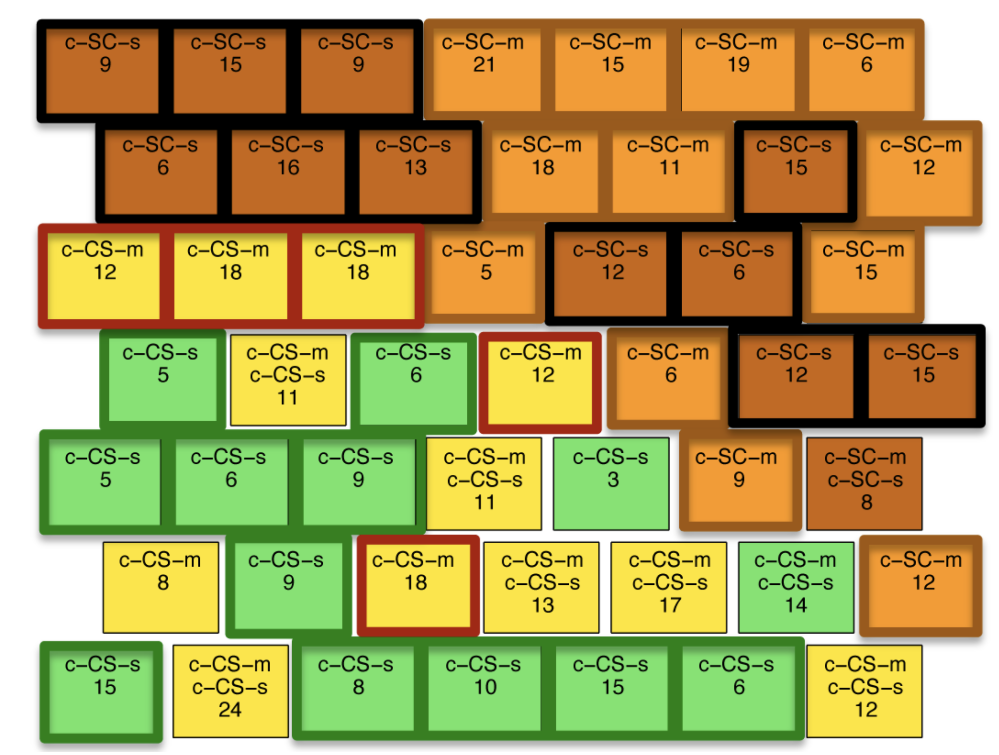

<center>Self-Organizing Feature Map - <a href='https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0129126'>image via Higuera, Gardiner, and Cios.</a></center>